Recently Google AI Research published a paper titled “EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks”. In this paper the authors propose a new architecture which achieves state of the art classification accuracy on ImageNet while being 8.4x smaller and 6.1x faster on inference than the best existing CNN.
It achieves high level of acacuracy on many other datasets like CIFAR-100, Flowers and Cars. Good results on multiple dataset shows that the architecture can be used for transfer learning. 

In this notebook, I try to compare the proposed efficient models with other popular architectures like densenet and resnet. I use  [GradCam](https://arxiv.org/abs/1610.02391) to highlight what different models are looking at.

You can find a very nice implementation of GradCam [here](https://github.com/FrancescoSaverioZuppichini/A-journey-into-Convolutional-Neural-Network-visualization-). I use the pretrained model weights provided [here](https://github.com/lukemelas/EfficientNet-PyTorch#loading-pretrained-models) for visualization.

# About EfficientNet


A naive way to increase the performance of neural networks is to increase make CNN deeper. A great example, would be resnet ehich has several variations ranging from 18 to 202. Making the CNN deeper or wider may increase the performance but it comes at great computational cost. So we need some way to balance our ever increasing quest for performance with compuatational cost. In the paper, the authors propose a new model scaling method that uses a simple compound coefficient to scale up CNNs in a more structured manner. This method helps them to decide when to increase the depth or width of the network.

The authors wanted to optimize for accuracy and efficieny. So, they performed a neural architecture search. This search yielded th Efficient-B0 archictecture which looks pretty simple and straightforward to implement.

![EfficientNet-B0 Architecture](https://1.bp.blogspot.com/-DjZT_TLYZok/XO3BYqpxCJI/AAAAAAAAEKM/BvV53klXaTUuQHCkOXZZGywRMdU9v9T_wCLcBGAs/s640/image2.png)

As you can see from the performance graph, EfficientNet uses fewer parameters and achieves very high accuracy. For more details please [refer](https://arxiv.org/abs/1905.11946)

![Effiecient Performance](https://1.bp.blogspot.com/-oNSfIOzO8ko/XO3BtHnUx0I/AAAAAAAAEKk/rJ2tHovGkzsyZnCbwVad-Q3ZBnwQmCFsgCEwYBhgL/s640/image3.png)

# Installing dependencies

In [1]:
! git clone https://github.com/FrancescoSaverioZuppichini/A-journey-into-Convolutional-Neural-Network-visualization-.git
!pip install efficientnet_pytorch

Cloning into 'A-journey-into-Convolutional-Neural-Network-visualization-'...
remote: Enumerating objects: 49, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 238 (delta 12), reused 49 (delta 12), pack-reused 189
Receiving objects: 100% (238/238), 106.41 MiB | 60.12 MiB/s, done.
Resolving deltas: 100% (70/70), done.
You are using pip version 19.0.3, however version 19.1.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
cd A-journey-into-Convolutional-Neural-Network-visualization-/

/kaggle/working/A-journey-into-Convolutional-Neural-Network-visualization-


# Import Packages

In [3]:
from torchvision.models import *
from visualisation.core.utils import device
from efficientnet_pytorch import EfficientNet
import glob
import matplotlib.pyplot as plt
import numpy as np
import torch 
from utils import *
import PIL.Image
import cv2

from visualisation.core.utils import device 
from visualisation.core.utils import image_net_postprocessing

from torchvision.transforms import ToTensor, Resize, Compose, ToPILImage
from visualisation.core import *
from visualisation.core.utils import image_net_preprocessing

# for animation
%matplotlib inline
from IPython.display import Image
from matplotlib.animation import FuncAnimation
from collections import OrderedDict

# Wrapper for calling effiecient net

In [4]:
def efficientnet(model_name='efficientnet-b0',**kwargs):
    return EfficientNet.from_pretrained(model_name).to(device)

# Loading Test Images
I will be using images from Caltech 256 Image dataset. It has images from 257 different categories. Each category has around 120 images. I will be using images from some interesting categories. you can easily choose other categories for visualization if you want.

In [5]:
max_img = 5
path = '/kaggle/input/caltech256/256_objectcategories/256_ObjectCategories/'
interesting_categories = ['009.bear','038.chimp','251.airplanes-101','158.penguin',
                          '190.snake/','024.butterfly','151.ostrich']

images = [] 
for category_name in interesting_categories:
    image_paths = glob.glob(f'{path}/{category_name}/*')
    category_images = list(map(lambda x: PIL.Image.open(x), image_paths[:max_img]))
    images.extend(category_images)

inputs  = [Compose([Resize((224,224)), ToTensor(), image_net_preprocessing])(x).unsqueeze(0) for x in images]  # add 1 dim for batch
inputs = [i.to(device) for i in inputs]

/opt/conda/lib/python3.6/site-packages/torchvision/transforms/functional.py:206: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mean = torch.tensor(mean, dtype=torch.float32)
/opt/conda/lib/python3.6/site-packages/torchvision/transforms/functional.py:207: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  std = torch.tensor(std, dtype=torch.float32)


# CAM Visualization

In [6]:
model_outs = OrderedDict()
model_instances = [alexnet,densenet121, resnet152, 
                  lambda pretrained:efficientnet(model_name='efficientnet-b0'),
                  lambda pretrained:efficientnet(model_name='efficientnet-b3')]

model_names = [m.__name__ for m in model_instances]
model_names[-2],model_names[-1] = 'EB0','EB3'

images = list(map(lambda x: cv2.resize(np.array(x),(224,224)),images)) # resize i/p img

for name,model in zip(model_names,model_instances):
    module = model(pretrained=True).to(device)
    module.eval()

    vis = GradCam(module, device)

    model_outs[name] = list(map(lambda x: tensor2img(vis(x, None,postprocessing=image_net_postprocessing)[0]), inputs))
    del module
    torch.cuda.empty_cache()

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /tmp/.torch/models/alexnet-owt-4df8aa71.pth
244418560it [00:02, 104031375.24it/s]
/opt/conda/lib/python3.6/site-packages/torchvision/transforms/functional.py:206: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mean = torch.tensor(mean, dtype=torch.float32)
/opt/conda/lib/python3.6/site-packages/torchvision/transforms/functional.py:207: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  std = torch.tensor(std, dtype=torch.float32)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /tmp/.torch/models/densenet121-a639ec97.pth
32342954it [00:00, 86582843.74it/s]
Downloading: "https://download

Loaded pretrained weights for efficientnet-b0


Downloading: "http://storage.googleapis.com/public-models/efficientnet-b3-c8376fa2.pth" to /tmp/.torch/models/efficientnet-b3-c8376fa2.pth
49380963it [00:00, 92179667.14it/s]


Loaded pretrained weights for efficientnet-b3


# Animating CAM

In [7]:
%%capture

# create a figure with two subplots
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1,6,figsize=(20,20))
axes = [ax2, ax3, ax4, ax5, ax6]
    
def update(frame):
    all_ax = []
    ax1.set_yticklabels([])
    ax1.set_xticklabels([])
    ax1.text(1, 1, 'Orig. Im', color="white", ha="left", va="top",fontsize=30)
    all_ax.append(ax1.imshow(images[frame]))
    for i,(ax,name) in enumerate(zip(axes,model_outs.keys())):
        ax.set_yticklabels([])
        ax.set_xticklabels([])        
        ax.text(1, 1, name, color="white", ha="left", va="top",fontsize=20)
        all_ax.append(ax.imshow(model_outs[name][frame], animated=True))

    return all_ax

ani = FuncAnimation(fig, update, frames=range(len(images)), interval=1000, blit=True)
model_names = [m.__name__ for m in model_instances]
model_names = ', '.join(model_names)
fig.tight_layout()
ani.save('../compare_arch.gif', writer='imagemagick') 

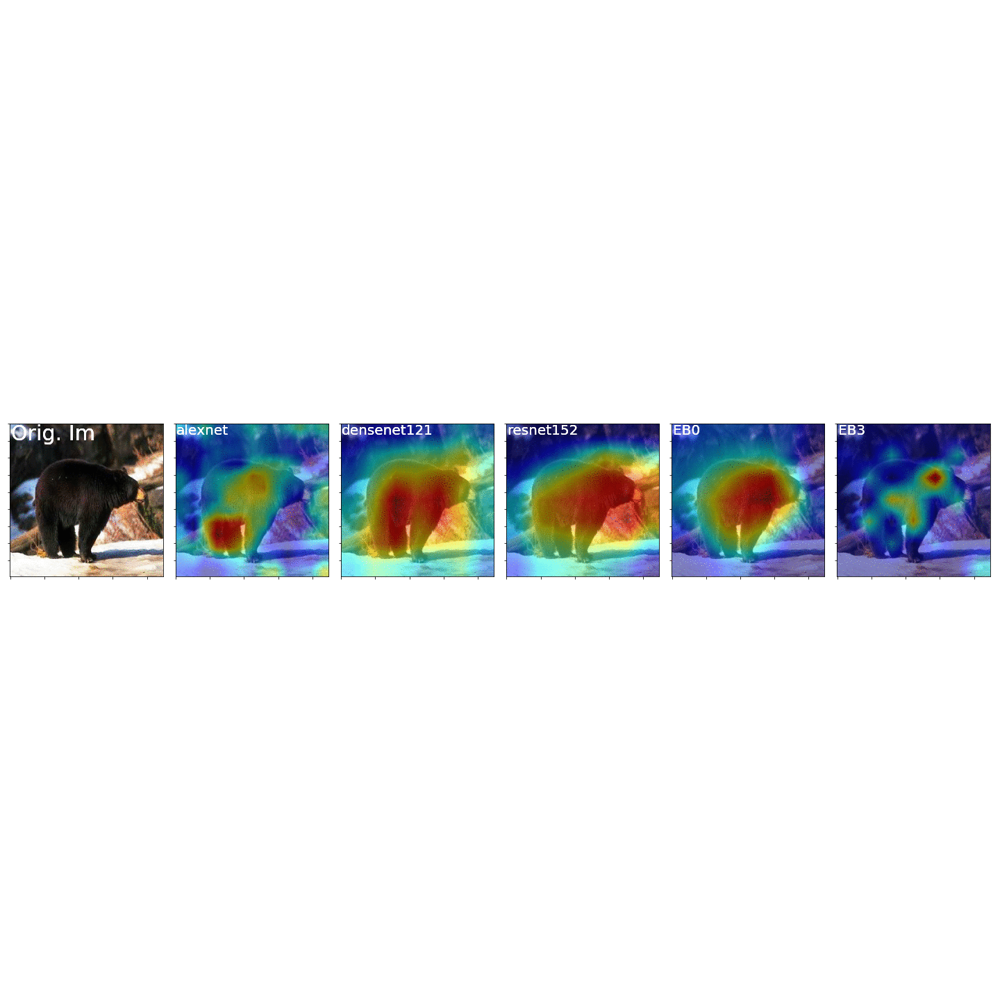

In [8]:
Image('../compare_arch.gif')

# Conclusion

As we can see from the above CAM vizualization, the highlighted areas are very specific for EB0 and EB3. The highlighted portions for alexnet are all over the place and don't make intuitive sense. Densenet 121 and Resnet 152 perform far better but still the size of highighted area is large. Surprisingly the performance of EB0 seems to be better than EB3 ! The pretrained model weights for EB7 haven't been release yet. I can't wait to see how it performs.

I think, the ability of EB0 and EB3 to quickly zoom in on the most relevant features in the image, makes it suitable for object tracking and detection problems. I am sure we will be seeing some amazing results in the coming months. 

In [9]:
cd ..

/kaggle/working


In [10]:
!rm -rf A-journey-into-Convolutional-Neural-Network-visualization-/